Dataset Information:

You are provided with historical data on Coffee supply chain from Jan 2010 to Dec 2011. There are 3 Tables – Fact Table, Location and Product. These three tables are merged and provided as one table for this examination purpose.

Attribute description is as below:

Profit – Profit made

Margin – Margin between the selling price and cost of production

Sales – sales amount of a product

COGS - Cost of goods sold (COGS) is the direct costs attributable to the production of the goods sold in a company. This amount includes the cost of the materials used in creating the good along with the direct labor costs used to produce the good. It excludes indirect expenses such as distribution costs and sales force costs.

Total Expenses

Marketing Expenses

Inventory – Quantity in store

Budget Profit – Predicted Profit

Budget COGS – Predicted COGS

Budget Margin – Predicted Margin

Budget Sales – Predicted sale amount of a product

Area Code – Location code

ProductId

State – Name of the state in USA

Market – Regions

Market Size – small, medium, large etc.

Product Type – Type of the coffee / Tea

Product – Product Name

Type - Product Classification.

In [77]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings
filterwarnings ('ignore')
from sklearn.cluster import KMeans
from sklearn.metrics  import silhouette_score
from sklearn.decomposition import PCA

In [78]:
## Read the data

df= pd.read_csv('coffee_chain.csv')
df.head()


,Profit,Margin,Sales,COGS,Total Expenses,Marketing,Inventory,Budget Profit,Budget COGS,Budget Margin,Budget Sales,Area Code,ProductId,State,Market,Market Size,Product Type,Product,Type
0,94,130,219,89,36,24,777,100,90,130,220,719,1,Colorado,Central,Major Market,Coffee,Amaretto,Regular
1,121,163,276,113,42,31,897,130,110,170,280,719,1,Colorado,Central,Major Market,Coffee,Amaretto,Regular
2,134,179,302,123,45,34,959,130,120,170,290,719,1,Colorado,Central,Major Market,Coffee,Amaretto,Regular
3,146,130,245,89,38,24,777,100,90,130,220,719,1,Colorado,Central,Major Market,Coffee,Amaretto,Regular
4,167,163,274,113,39,31,897,130,110,170,280,719,1,Colorado,Central,Major Market,Coffee,Amaretto,Regular


In [79]:
## Understanding the data 

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4248 entries, 0 to 4247
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Profit          4248 non-null   int64 
 1   Margin          4248 non-null   int64 
 2   Sales           4248 non-null   int64 
 3   COGS            4248 non-null   int64 
 4   Total Expenses  4248 non-null   int64 
 5   Marketing       4248 non-null   int64 
 6   Inventory       4248 non-null   int64 
 7   Budget Profit   4248 non-null   int64 
 8   Budget COGS     4248 non-null   int64 
 9   Budget Margin   4248 non-null   int64 
 10  Budget Sales    4248 non-null   int64 
 11  Area Code       4248 non-null   int64 
 12  ProductId       4248 non-null   int64 
 13  State           4248 non-null   object
 14  Market          4248 non-null   object
 15  Market Size     4248 non-null   object
 16  Product Type    4248 non-null   object
 17  Product         4248 non-null   object
 18  Type    

In [80]:
df.shape

(4248, 19)

In [81]:
## Checking the missing Value 
df.isnull().sum()

Profit            0
Margin            0
Sales             0
COGS              0
Total Expenses    0
Marketing         0
Inventory         0
Budget Profit     0
Budget COGS       0
Budget Margin     0
Budget Sales      0
Area Code         0
ProductId         0
State             0
Market            0
Market Size       0
Product Type      0
Product           0
Type              0
dtype: int64

In [82]:
## Checking the  numerical and categorical column
num_col = df.select_dtypes(include = 'number').columns.to_list()
num_col

['Profit',
 'Margin',
 'Sales',
 'COGS',
 'Total Expenses',
 'Marketing',
 'Inventory',
 'Budget Profit',
 'Budget COGS',
 'Budget Margin',
 'Budget Sales',
 'Area Code',
 'ProductId']

In [83]:
cat_col = df.select_dtypes(exclude = 'number').columns.to_list()
cat_col

['State', 'Market', 'Market Size', 'Product Type', 'Product', 'Type']

In [84]:
# Checking the anaomaolies
for i in df:
    print(df[i].unique())
    print()
    print('*****')

[  94  121  134  146  167  197  190  133  128  142  199  105   90   96
  111  156  153  184   11   17   13   15   25   26   19   18   10   12
   23    8   34   28   20   47   39   37   42   33   32   14   21   29
   22   24   35   41   49   48   30   31   43   57   68   66   45   55
   46   38   36   67   52   50   53   58   73   70   44 -190  -76  -74
 -113  -56 -156   -2  -61  -83   -3   -7    2   -4   -8  -14  -10   -5
  -15   -6    1  -11   16   27  -88 -110  -40 -192  -27 -139  -41 -116
  -84 -138 -131    0   -9  104   72   54   64   40  106  101   92   99
  102  115  136  150  123  171  114  151  159  107  141  188   86   95
  168  207  -32  -33  -18  -21  -26  -47  -65  -12  -39  -44  -17  -46
  -13   51   63   80   87   74   61   56   62    7    9   -1    3  229
  247  204  459  252  363  367  263  309  129  137    4    5    6   65
  192  279  344  165  174  258  160  162  205  249  243  253  208  163
  194  173  225  178  119  166  120  138  177  232  221  287  191  288
   98 

Inferences :

1. The coffee data cotains 4248 rows and 19 columns.
2. It has 13 numerical column and 6 categorical columns.
3. There is no missing value and no anomalies.

## FIVE POINT SUMMARY

In [85]:
df[num_col].describe().T

,count,mean,std,min,25%,50%,75%,max
Profit,4248.0,61.097693,101.708546,-638.0,17.00,40.0,92.0,778.0
Margin,4248.0,104.293315,94.342522,-302.0,52.75,76.0,132.0,613.0
Sales,4248.0,192.987524,151.133127,17.0,100.00,138.0,230.0,912.0
COGS,4248.0,84.433145,67.249769,0.0,43.00,60.0,100.0,364.0
Total Expenses,4248.0,54.063559,32.352598,10.0,33.00,46.0,65.0,190.0
Marketing,4248.0,31.185028,27.023264,0.0,13.00,22.0,39.0,156.0
Inventory,4248.0,749.381356,661.031896,-3534.0,432.00,619.0,910.5,8252.0
Budget Profit,4248.0,60.913371,79.546123,-320.0,20.00,40.0,80.0,560.0
Budget COGS,4248.0,74.830508,66.238145,0.0,30.00,50.0,90.0,450.0
Budget Margin,4248.0,100.819209,92.602725,-210.0,50.00,70.0,130.0,690.0


In [86]:
for i in cat_col:
    print( df[i].value_counts(normalize= True)*100)
    print()
    print('******')

State
Utah             6.779661
California       6.779661
Colorado         6.214689
Nevada           6.214689
Oregon           6.214689
Washington       5.649718
Wisconsin        5.084746
Illinois         5.084746
Missouri         5.084746
Iowa             5.084746
Florida          5.084746
Ohio             5.084746
New York         4.519774
New Hampshire    3.954802
Louisiana        3.954802
New Mexico       3.954802
Oklahoma         3.954802
Texas            3.954802
Connecticut      3.954802
Massachusetts    3.389831
Name: proportion, dtype: float64

******
Market
Central    31.638418
West       31.638418
East       20.903955
South      15.819209
Name: proportion, dtype: float64

******
Market Size
Small Market    59.887006
Major Market    40.112994
Name: proportion, dtype: float64

******
Product Type
Espresso      27.683616
Coffee        24.858757
Herbal Tea    24.858757
Tea           22.598870
Name: proportion, dtype: float64

******
Product
Lemon                11.299435
Caffe M

## Data Visulaization

## Univariant Analysis

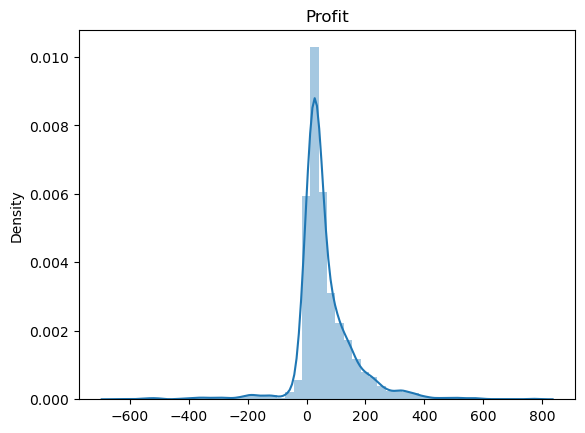

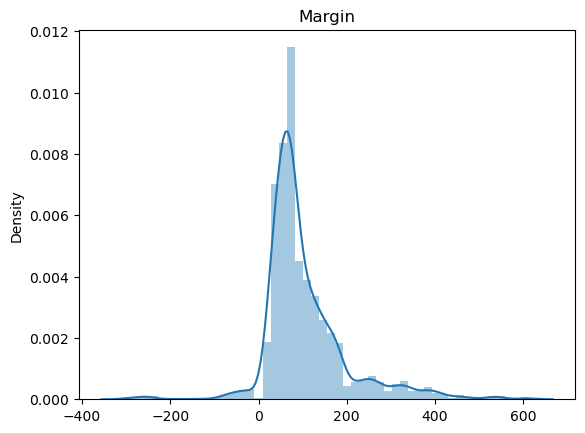

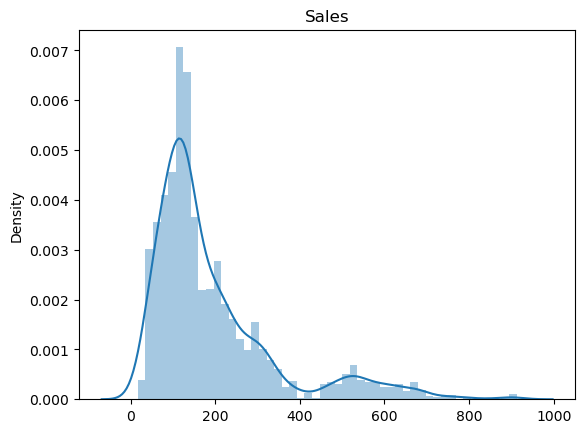

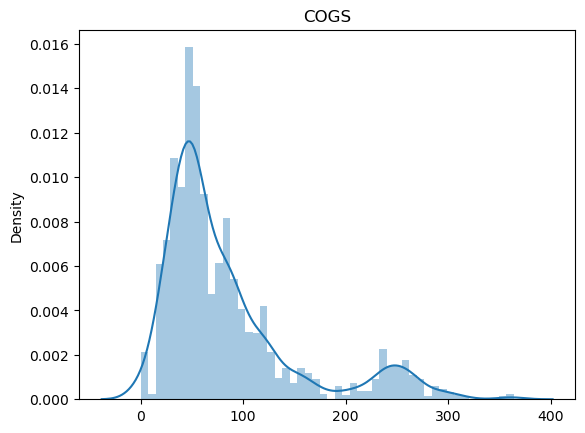

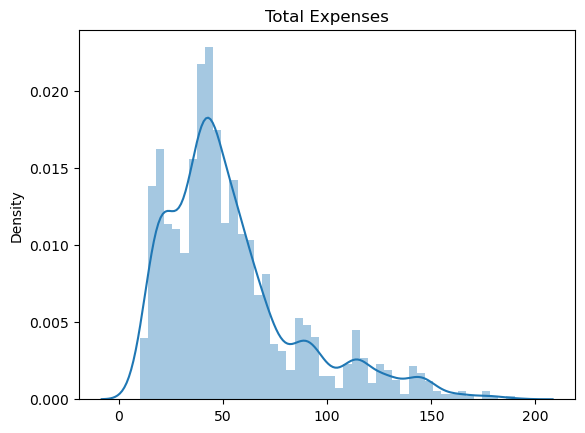

...

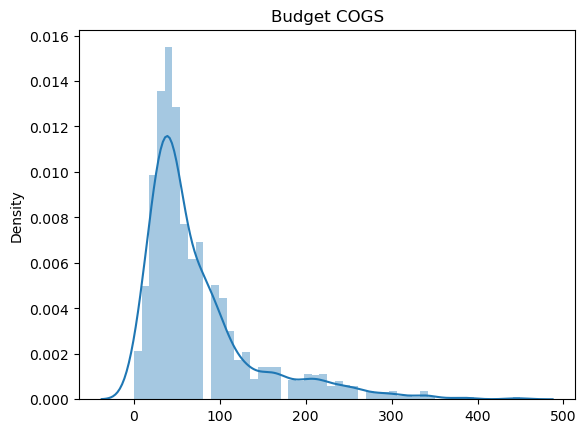

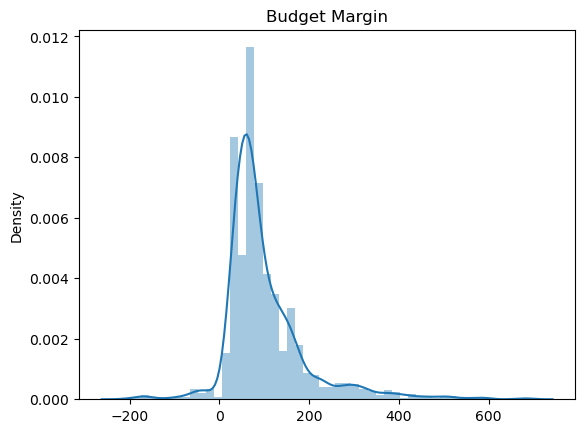

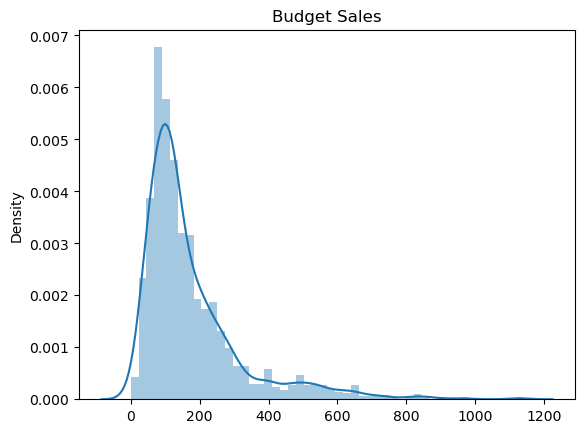

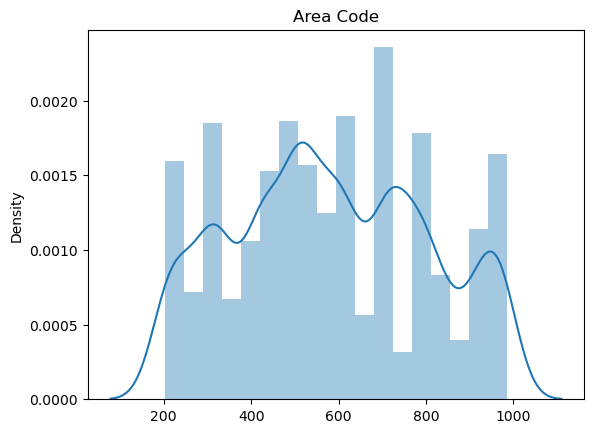

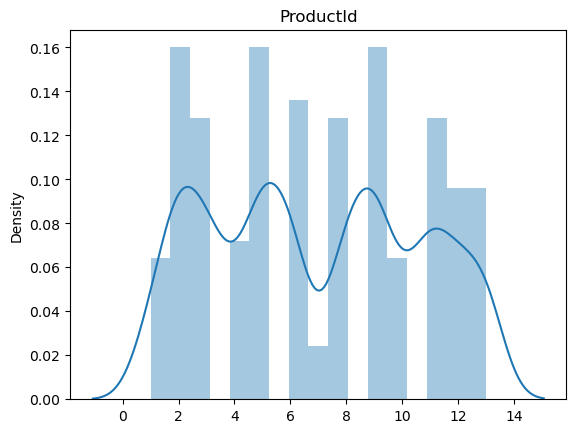

In [87]:
for i in num_col:
    sns.distplot(x= df[i])
    plt.title(i)
    plt.show()

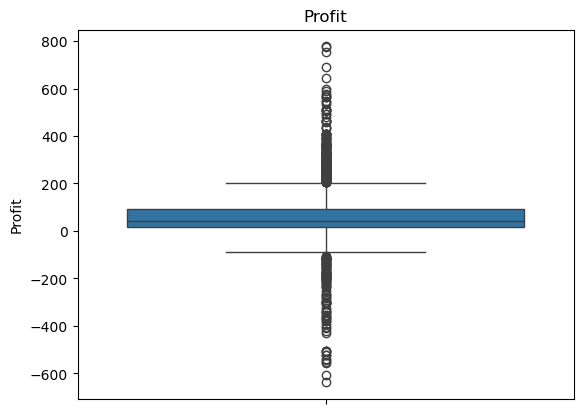

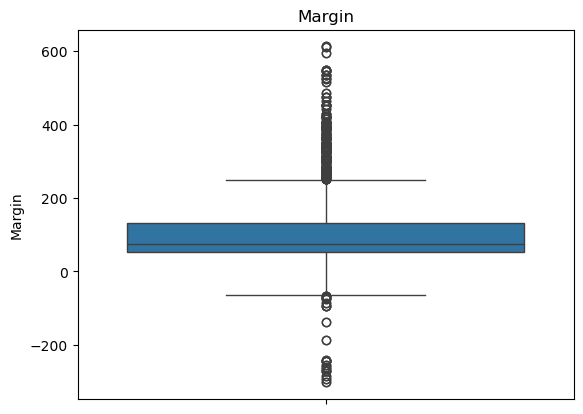

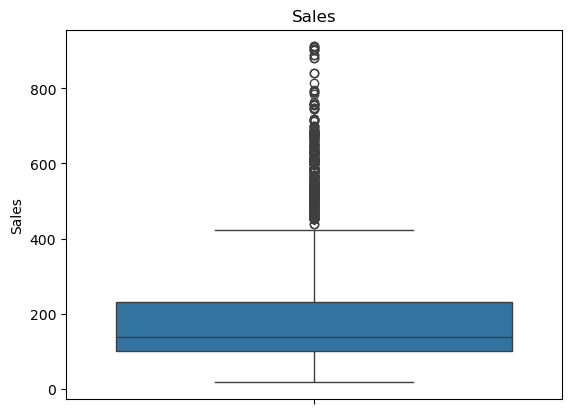

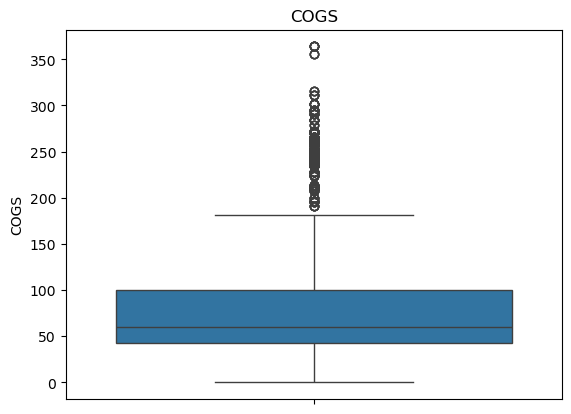

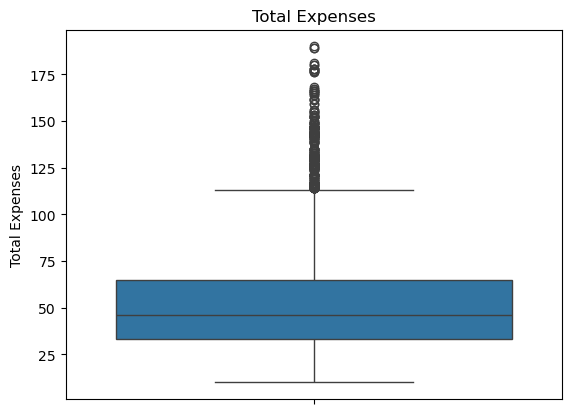

...

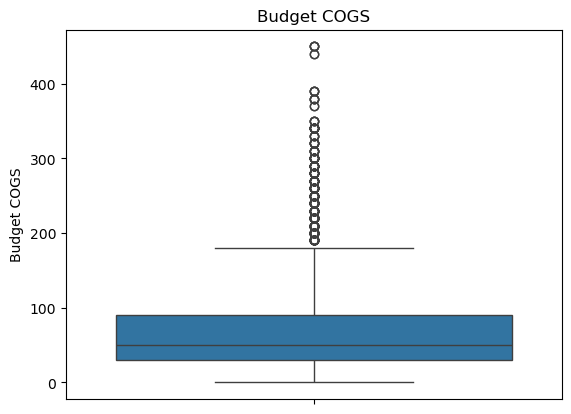

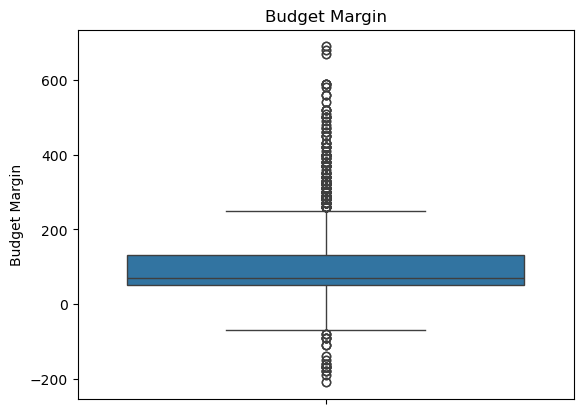

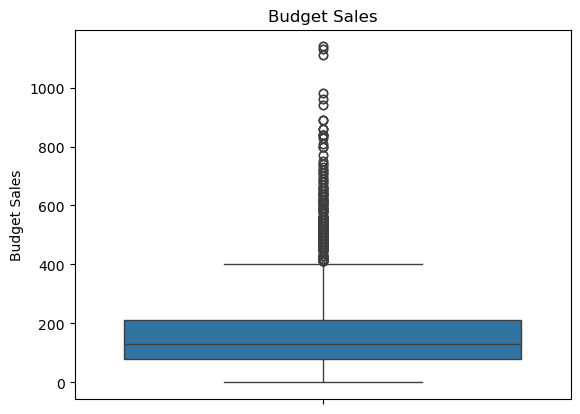

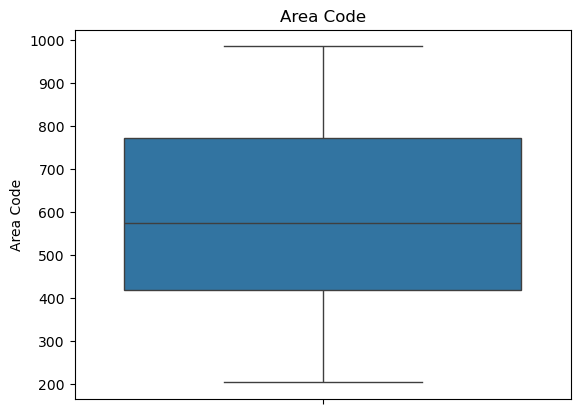

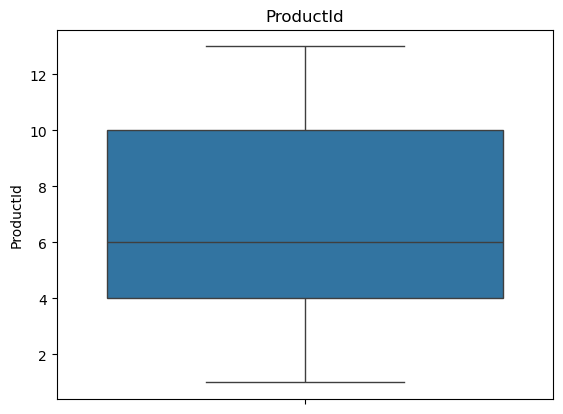

In [88]:
## numeric - boxplot

for i in num_col:
    sns.boxplot(y=df[i])
    plt.title(i)
    plt.show()

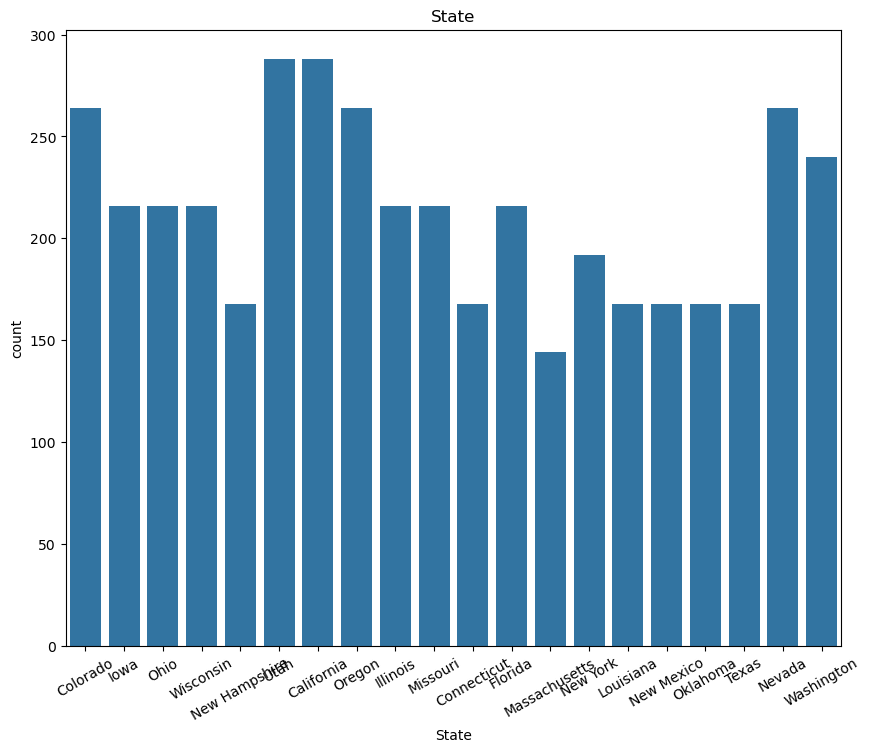

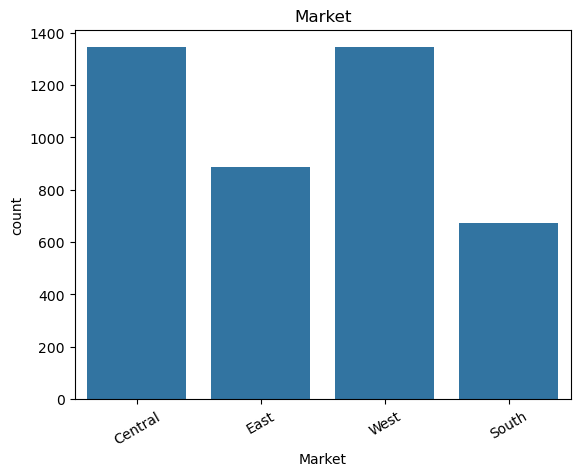

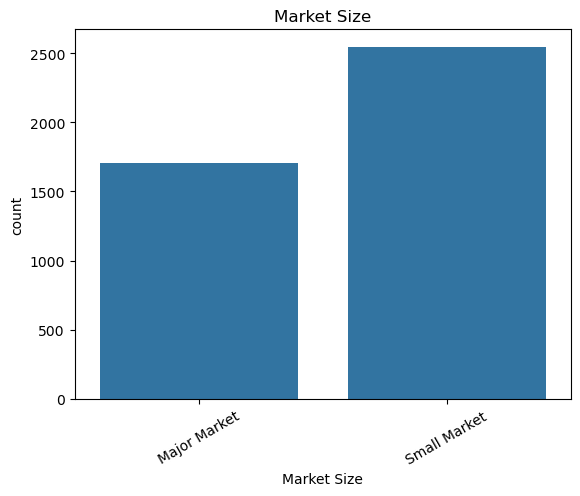

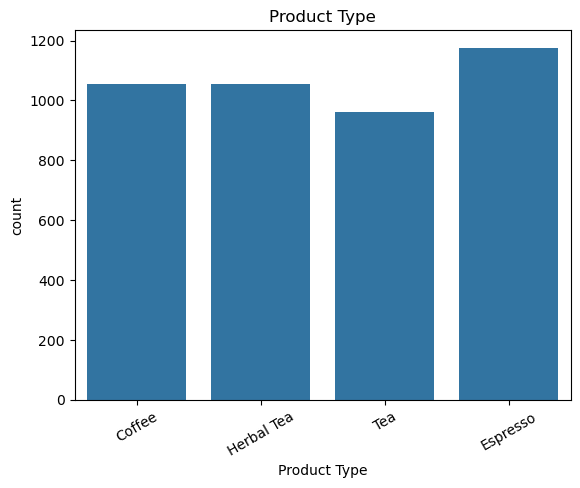

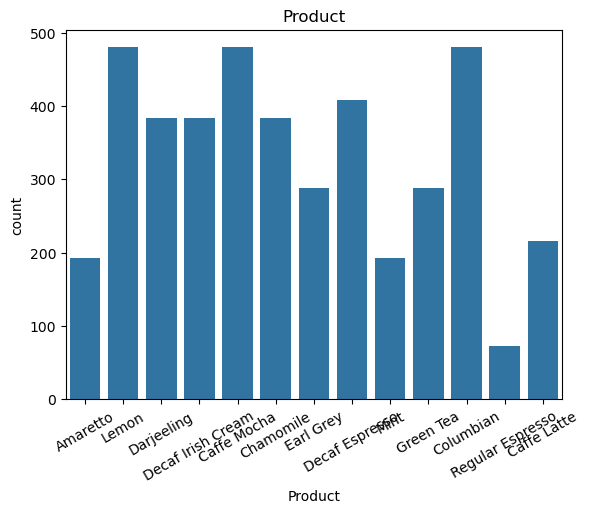

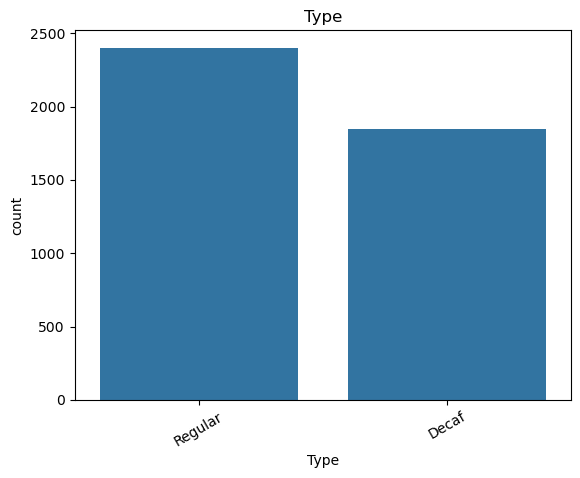

In [89]:
plt.figure(figsize=[10,8])
for i in cat_col:
    sns.countplot(x= df[i])
    plt.title(i)
    plt.xticks(rotation = 30)
    plt.show()

## Bivariant Analysis

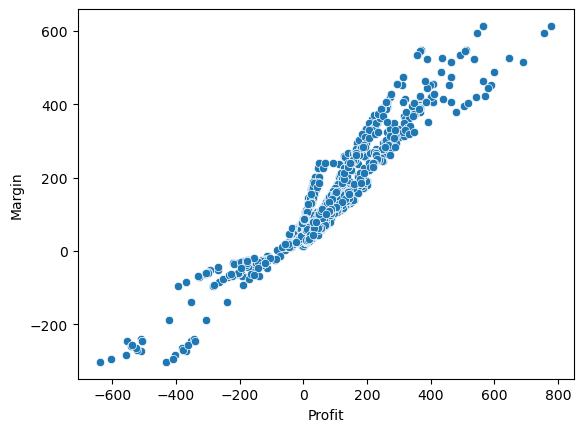

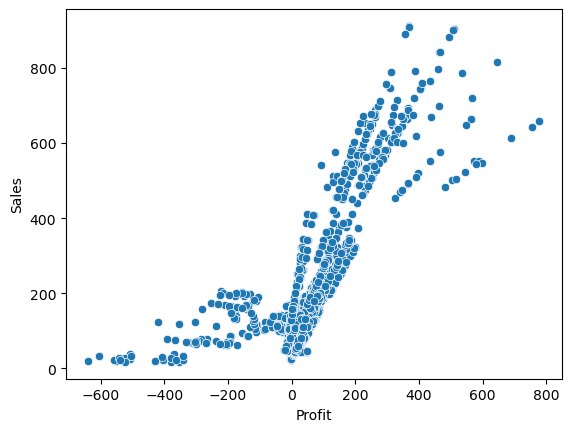

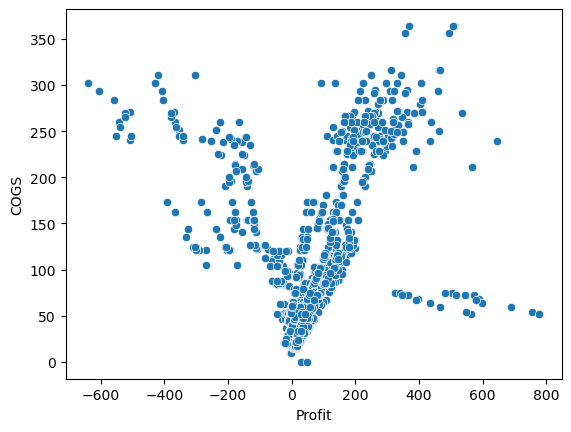

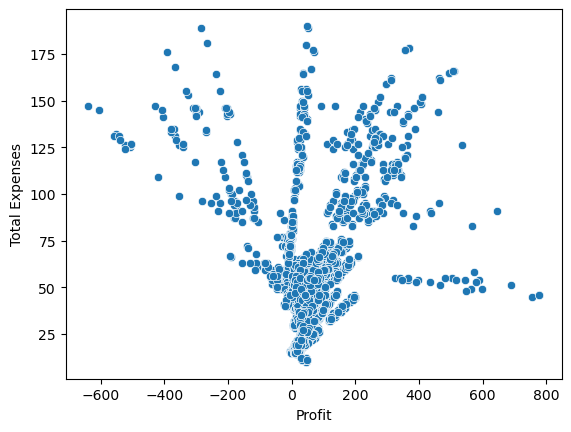

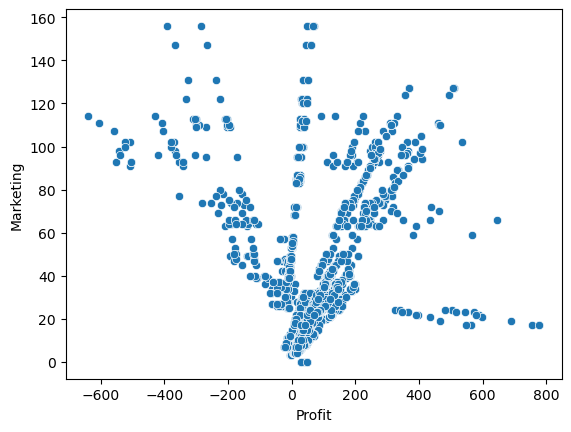

...

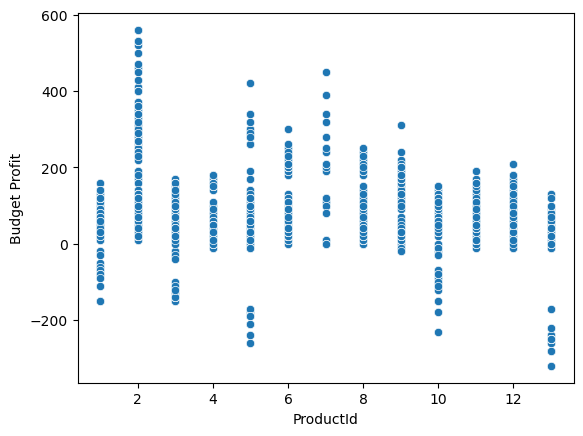

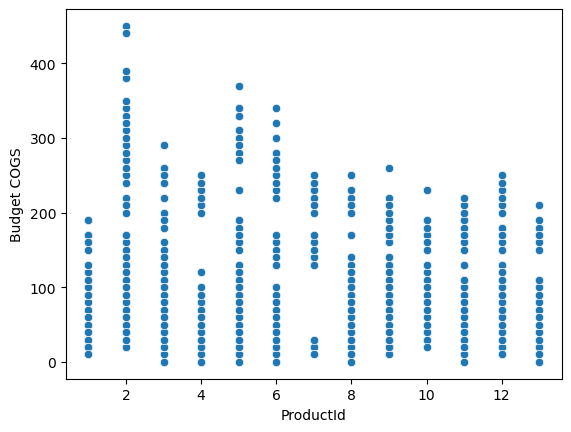

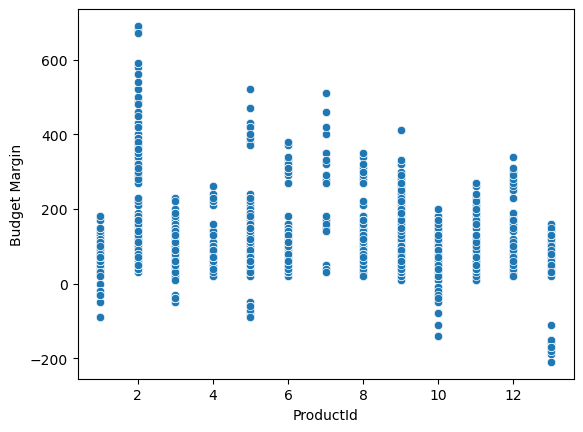

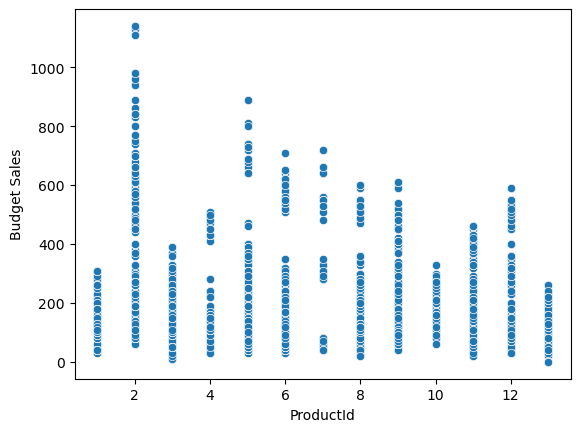

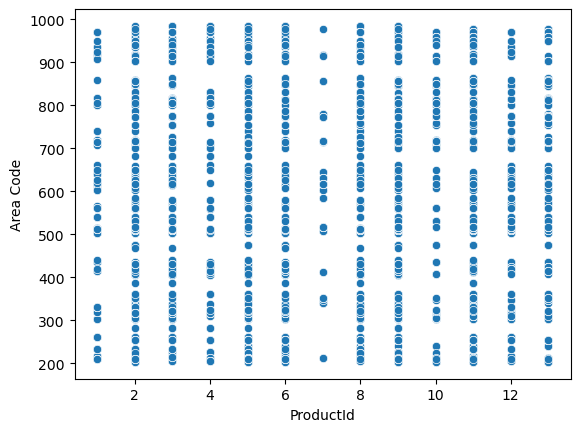

In [90]:
for i in num_col:
    for j in num_col:
        if i!=j:
            sns.scatterplot(x= df[i],y=df[j])
            plt.show()
        

Inferences :

There is no any linear relationship between the numerical Analysis , will proceed further analysis.

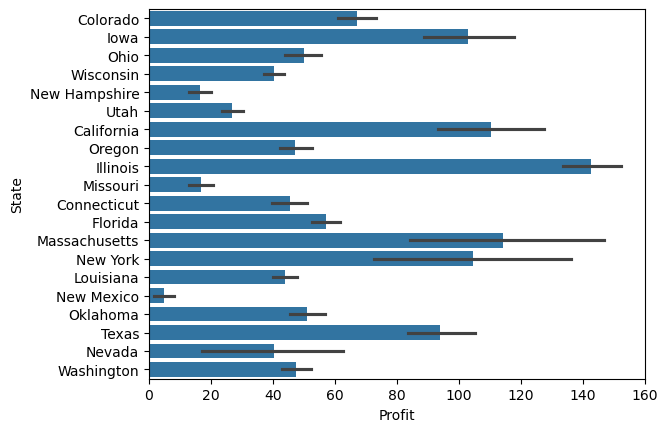

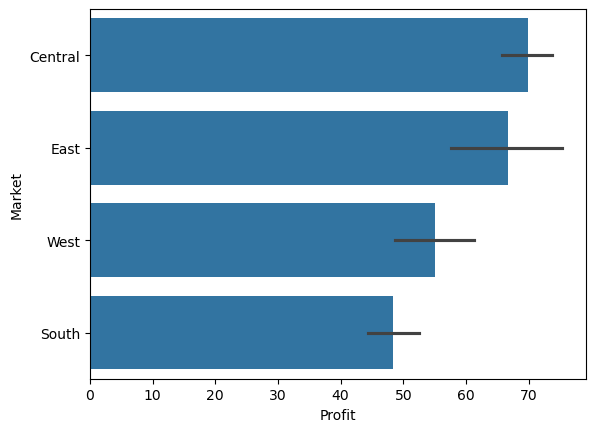

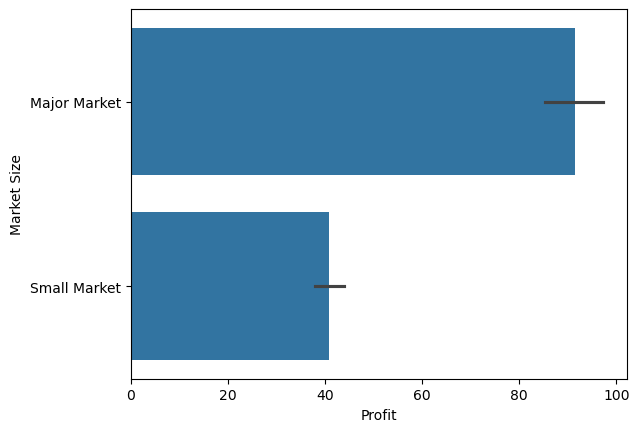

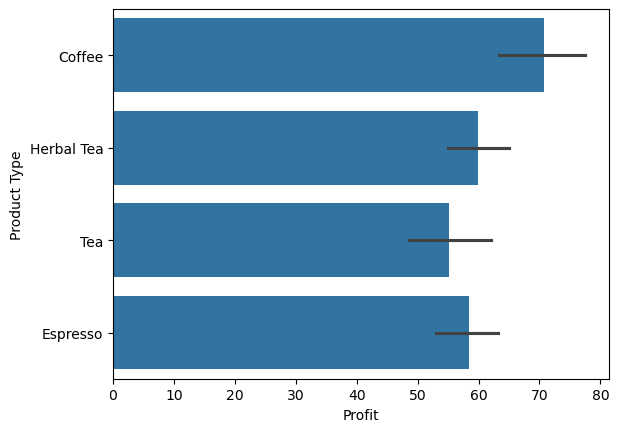

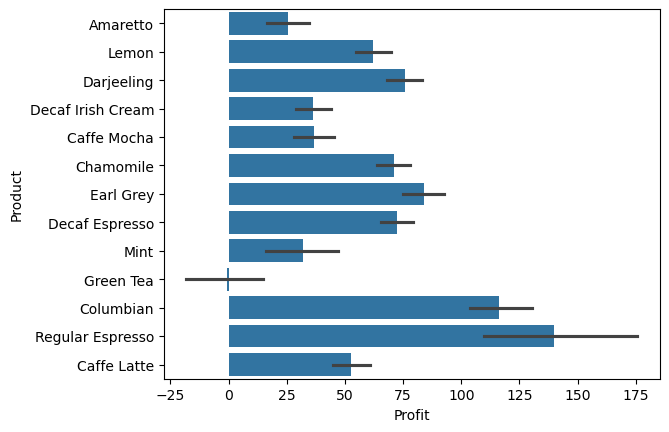

...

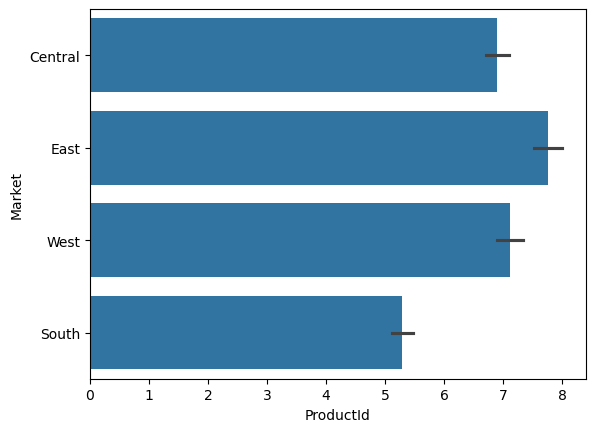

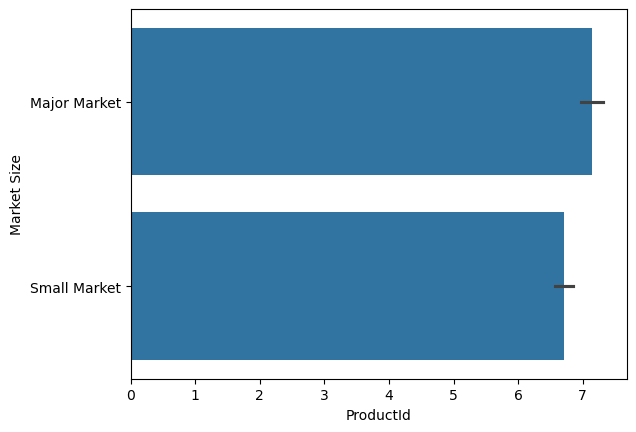

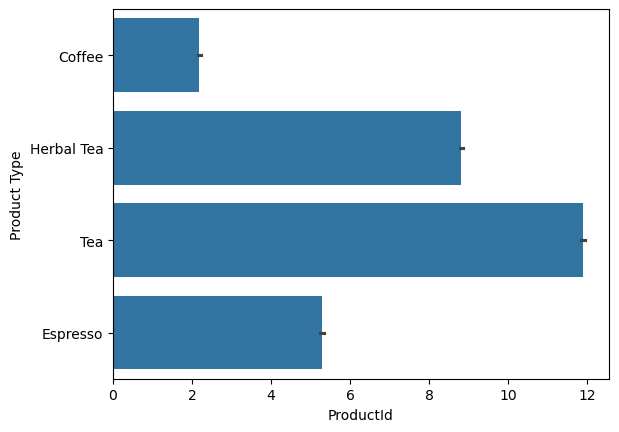

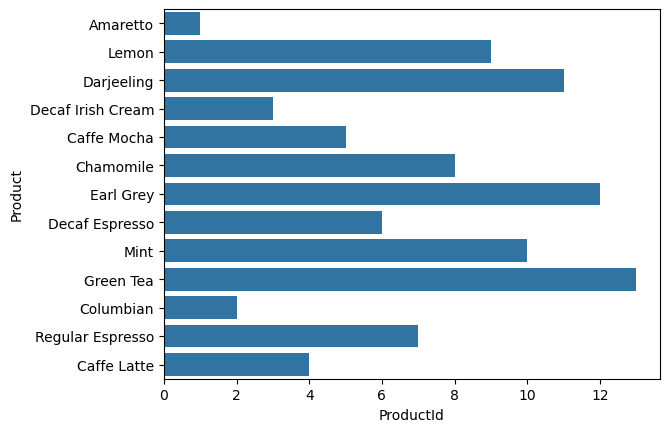

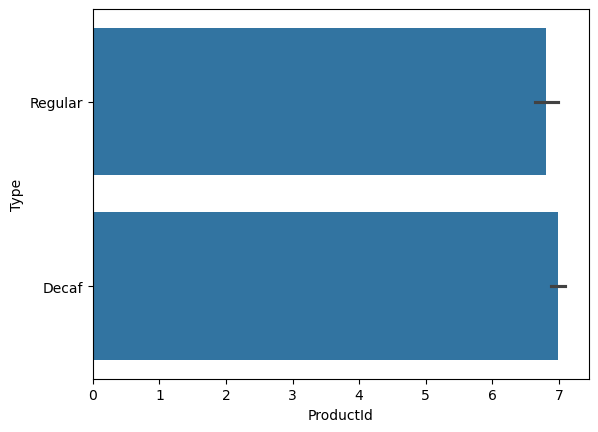

In [91]:
for i in num_col:
    for j in cat_col:
        sns.barplot(x= df[i],y=df[j])
        plt.xlabel(i)
        plt.ylabel(j)
        plt.show()

<Axes: >

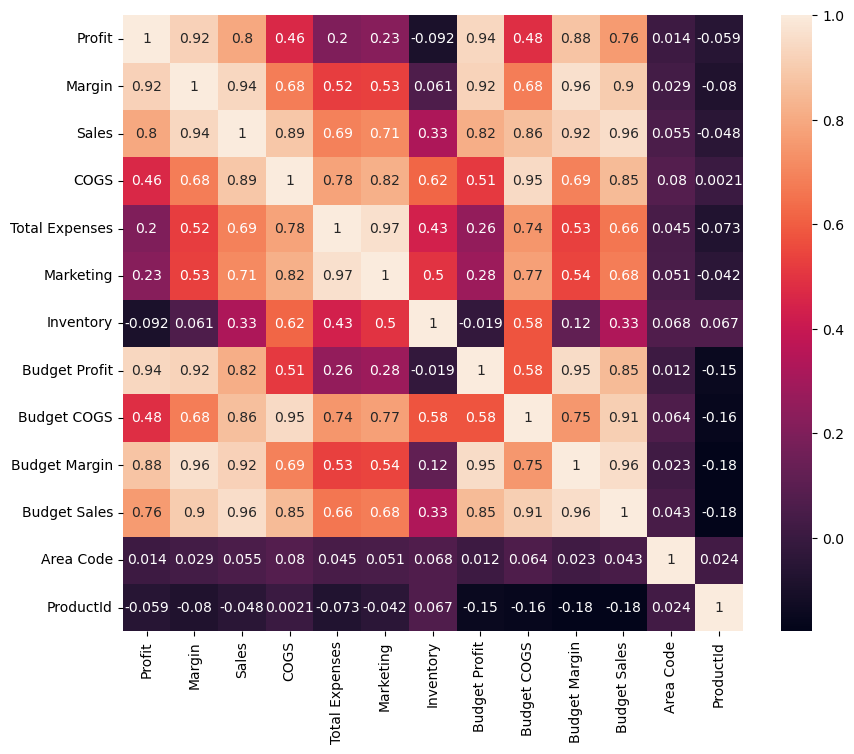

In [92]:
## Multivariant Analysis
plt.figure(figsize=[10,8])
sns.heatmap(data=df[num_col].corr(),annot= True)

In [93]:
#Checking the skweness

df[num_col].skew()

Profit            0.445363
Margin            1.425170
Sales             1.881939
COGS              1.672370
Total Expenses    1.319370
Marketing         1.645226
Inventory         2.894880
Budget Profit     1.271877
Budget COGS       1.974830
Budget Margin     2.024326
Budget Sales      2.283517
Area Code         0.084530
ProductId         0.073739
dtype: float64

In [94]:
## Apply Power Transformation
from sklearn.preprocessing import PowerTransformer
P= PowerTransformer()
df[num_col]= P.fit_transform(df[num_col])

In [95]:
df[num_col].skew()

Profit            1.154299
Margin            1.353615
Sales             0.003151
COGS              0.111217
Total Expenses   -0.002276
Marketing         0.021233
Inventory         3.495680
Budget Profit     1.565099
Budget COGS       0.073833
Budget Margin     1.459371
Budget Sales      0.099127
Area Code        -0.099674
ProductId        -0.144730
dtype: float64

## Inferences

 I have reduced the skewness at certain extend , will proceed for further analysis.

## Encoding 

In [96]:
cat_col

['State', 'Market', 'Market Size', 'Product Type', 'Product', 'Type']

In [99]:
from sklearn.preprocessing import OrdinalEncoder
O = OrdinalEncoder()
df[cat_col]= O.fit_transform(df[cat_col])

## Scaling

In [101]:
from sklearn.preprocessing import StandardScaler

In [102]:
S= StandardScaler()
x= df.columns.to_list()
df[x]=S.fit_transform(df[x])
df[x]

,Profit,Margin,Sales,COGS,Total Expenses,Marketing,Inventory,Budget Profit,Budget COGS,Budget Margin,Budget Sales,Area Code,ProductId,State,Market,Market Size,Product Type,Product,Type
0,0.313083,0.274684,0.572344,0.342456,-0.425134,0.017995,0.031969,0.487737,0.535506,0.337272,0.621251,0.646602,-1.811710,-1.409155,-1.198055,-1.221867,-1.327213,-1.745522,0.877496
1,0.590473,0.623204,0.893985,0.682128,-0.163117,0.323697,0.215828,0.872199,0.799925,0.757429,0.969262,0.646602,-1.811710,-1.409155,-1.198055,-1.221867,-1.327213,-1.745522,0.877496
2,0.724543,0.792047,1.016723,0.808165,-0.045092,0.437668,0.310987,0.872199,0.918872,0.757429,1.021153,0.646602,-1.811710,-1.409155,-1.198055,-1.221867,-1.327213,-1.745522,0.877496
3,0.848557,0.274684,0.729461,0.342456,-0.333504,0.017995,0.031969,0.487737,0.535506,0.337272,0.621251,0.646602,-1.811710,-1.409155,-1.198055,-1.221867,-1.327213,-1.745522,0.877496
4,1.066116,0.623204,0.884011,0.682128,-0.289377,0.323697,0.215828,0.872199,0.799925,0.757429,0.969262,0.646602,-1.811710,-1.409155,-1.198055,-1.221867,-1.327213,-1.745522,0.877496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4243,0.251665,0.105546,0.450777,0.112220,0.300727,0.017995,-2.437393,-0.275913,-0.164521,-0.089476,0.008000,1.004386,-0.733264,1.083388,0.426893,-1.221867,-0.413140,-1.436255,0.877496
4244,-0.225582,-0.264903,-0.186599,-0.345517,-0.007398,-0.370663,-1.709943,-0.275913,-0.403251,-0.306215,-0.299371,0.490688,-0.733264,1.083388,0.426893,-1.221867,-0.413140,-1.436255,0.877496
4245,0.190338,0.063243,0.400166,0.058881,0.300727,-0.031413,-2.215504,-0.149319,-0.403251,-0.306215,-0.299371,0.490688,-0.733264,1.083388,0.426893,-1.221867,-0.413140,-1.436255,0.877496
4246,0.169918,0.042088,0.385329,0.058881,0.268953,-0.031413,-0.859649,-0.149319,0.041257,-0.089476,0.098425,1.684433,-0.733264,1.083388,0.426893,-1.221867,-0.413140,-1.436255,0.877496


In [103]:
## Finding cov 

cov = np.cov(df[x].T)
cov

array([[ 1.00023546,  0.93089328,  0.7400511 ,  0.46329963,  0.23657358,
         0.29274204, -0.03370355,  0.9376666 ,  0.45813076,  0.90348043,
         0.77175386,  0.019481  , -0.05453469, -0.16054517, -0.06381049,
        -0.25871735, -0.04777384, -0.00558045,  0.0344773 ],
       [ 0.93089328,  1.00023546,  0.85796994,  0.63136748,  0.50011178,
         0.53603884,  0.06254426,  0.92554541,  0.61973072,  0.96821069,
         0.88129661,  0.02618784, -0.07693387, -0.16642326, -0.03873347,
        -0.2692488 , -0.07180204, -0.01396193,  0.04036205],
       [ 0.7400511 ,  0.85796994,  1.00023546,  0.84995746,  0.70234522,
         0.76809369,  0.17784946,  0.73033778,  0.83818557,  0.8233646 ,
         0.95034778,  0.01876914, -0.05749343, -0.15772089, -0.01696834,
        -0.34265524, -0.06488706,  0.03760745, -0.02578729],
       [ 0.46329963,  0.63136748,  0.84995746,  1.00023546,  0.81215195,
         0.8976278 ,  0.5264671 ,  0.48259132,  0.95962685,  0.59825833,
         0.774

<Axes: >

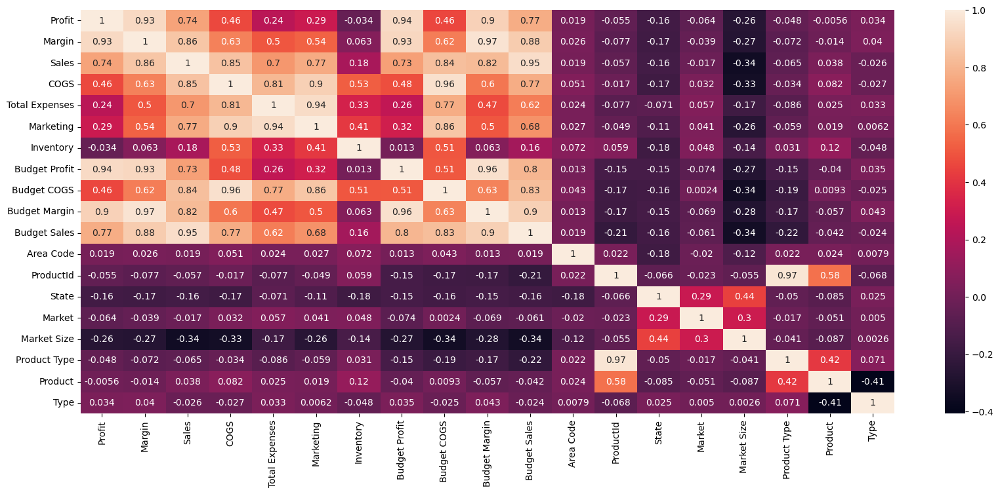

In [105]:
plt.figure(figsize=(20,8))
sns.heatmap(data = df[x].corr(),annot= True)

In [106]:
eig_val,eig_vec = np.linalg.eig(cov)


In [107]:
print(sorted(eig_val,reverse = True))

[7.723582121424973, 2.521078026193959, 2.1486194701407975, 1.5697104212083808, 1.2185008905603951, 0.9846143383283162, 0.7585014055277706, 0.6401661267716897, 0.5380593176898548, 0.40555364497418883, 0.21745323518966245, 0.0904032121089054, 0.08255569786574046, 0.036590459100675446, 0.030806516123743997, 0.020239422881486765, 0.007662800208070046, 0.006290846517825093, 0.00408579335733235]


In [108]:
eig_vec

array([[-2.78704650e-01, -1.19649046e-01, -3.63688062e-01,
         9.17569008e-02,  2.79904189e-03, -7.16341436e-02,
         1.31501567e-01, -7.23709112e-02, -4.52826767e-04,
         2.45905971e-02,  2.35986171e-02,  6.22808234e-01,
        -1.42893081e-01, -1.03680339e-01, -3.83210554e-01,
        -3.91558458e-01,  3.50368257e-02, -5.58140797e-02,
         1.22142982e-01],
       [-3.24693384e-01, -7.78323524e-02, -2.31916272e-01,
         1.06764565e-01, -2.26552770e-02, -4.66701246e-02,
         2.31515722e-02, -3.55347679e-02, -8.25808711e-02,
         1.34730837e-02,  2.55406919e-01,  1.12760553e-01,
        -1.53937571e-01,  5.98036050e-03, -1.06516745e-01,
         7.34520315e-01, -1.78715567e-01,  1.23928981e-01,
        -3.34660375e-01],
       [-3.43652729e-01,  3.55417297e-02, -2.02404267e-02,
         7.83201892e-02,  5.91649744e-03,  2.66508566e-02,
        -1.23093872e-01,  9.74186609e-02, -7.23574318e-03,
         6.43317694e-02, -3.30050331e-01,  6.16036146e-02,
    

In [112]:
exp_var=[]
for i in eig_val:
    e=i/sum(eig_val)*100
    exp_var.append(e)
print(exp_var)
    

[40.6408629072404, 13.26570816885438, 11.30586144524726, 8.259688966785601, 6.41165289202349, 5.1809608173262465, 3.9911728978050878, 3.368502255425918, 2.8312245046942386, 2.133990398212633, 1.1442212928071374, 0.475694372369067, 0.43440138868544925, 0.19253602909179385, 0.16210139010003566, 0.10649820222231429, 0.021499113376685617, 0.04032103340726719, 0.03310192432501137]


In [113]:
cum_sum = np.cumsum(exp_var)
cum_sum

array([ 40.64086291,  53.90657108,  65.21243252,  73.47212149,
        79.88377438,  85.0647352 ,  89.0559081 ,  92.42441035,
        95.25563486,  97.38962525,  98.53384655,  99.00954092,
        99.44394231,  99.63647834,  99.79857973,  99.90507793,
        99.92657704,  99.96689808, 100.        ])

In [114]:
cum_sum[cum_sum > 90]

array([ 92.42441035,  95.25563486,  97.38962525,  98.53384655,
        99.00954092,  99.44394231,  99.63647834,  99.79857973,
        99.90507793,  99.92657704,  99.96689808, 100.        ])

In [115]:
len(cum_sum[cum_sum >90])

12

In [116]:
from sklearn.decomposition import PCA

In [117]:
pca=PCA(n_components=12,random_state= 42)

In [118]:
mypca=pca.fit_transform(df[x])

In [119]:
pca_df= pd.DataFrame(mypca,columns=['PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7','PCA8','PCA9','PCA10','PCA11','PCA12'])
pca_df

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,PCA9,PCA10,PCA11,PCA12
0,1.510599,-2.201625,0.193569,2.782646,-0.763477,0.017472,0.134126,-0.034417,-0.044742,-0.282031,-0.551585,-0.108579
1,2.543507,-2.183862,0.163618,2.628215,-0.776299,-0.003957,0.180032,0.097129,-0.008086,-0.308208,-0.486509,-0.055350
2,2.846374,-2.123572,0.236296,2.587986,-0.793286,-0.004337,0.187769,0.133612,0.012039,-0.327139,-0.477769,-0.177241
3,1.737718,-2.248041,0.025921,2.714128,-0.768170,-0.009877,0.156249,-0.021374,-0.025362,-0.297026,-0.545305,-0.450889
4,2.639729,-2.257757,-0.050886,2.595107,-0.765214,-0.047696,0.283702,0.146858,-0.032745,-0.330672,-0.534689,-0.352163
...,...,...,...,...,...,...,...,...,...,...,...,...
4243,0.126293,-1.814802,-0.138468,0.008884,-1.225466,-0.552558,-1.981215,-1.652040,-1.217583,-0.303750,-0.229150,-0.561599
4244,-0.864185,-1.754912,0.053469,0.160033,-1.131606,-0.198541,-1.167394,-1.323331,-1.373553,-0.271484,0.063370,-0.202552
4245,-0.153128,-1.791917,-0.092203,-0.077285,-1.189869,-0.136484,-1.635142,-1.630140,-1.203876,-0.295710,-0.008135,-0.718835
4246,0.332834,-1.393590,0.393395,0.421513,-1.265647,-1.290838,-1.192977,-0.730608,-1.519230,-0.391231,-0.012178,-0.289683


## Visualize the spread of data across PCA components

In [120]:
cum_sum_exp = np.cumsum(exp_var)

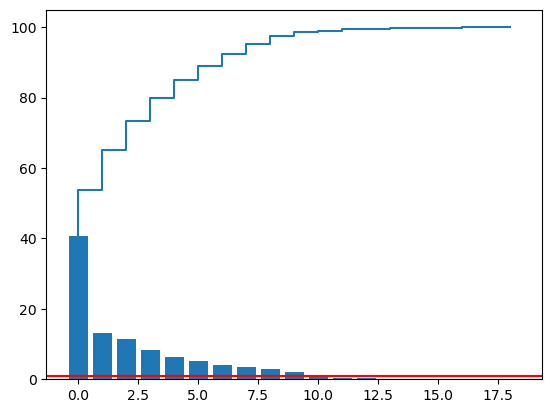

In [123]:
plt.bar(range(19),exp_var)
plt.step(range(19),cum_sum_exp)
plt.axhline(.90,c='r')
plt.show()

In [125]:
#Check the outliers
q1 = pca_df.quantile(0.25)
q3 = pca_df.quantile(0.75)
iqr=q3-q1

lw= q1+(1.5 * iqr)
uw =q3-(1.5 * iqr)

pca_df[(pca_df<=uw)  & (pca_df>=lw)]


,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,PCA9,PCA10,PCA11,PCA12
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
4243,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4245,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4246,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [128]:
from sklearn.cluster import KMeans

In [131]:
km = KMeans(n_clusters=6,random_state=42)
km.fit(mypca)

KMeans(n_clusters=6, random_state=42)

##  Optimal number of cluster Value.

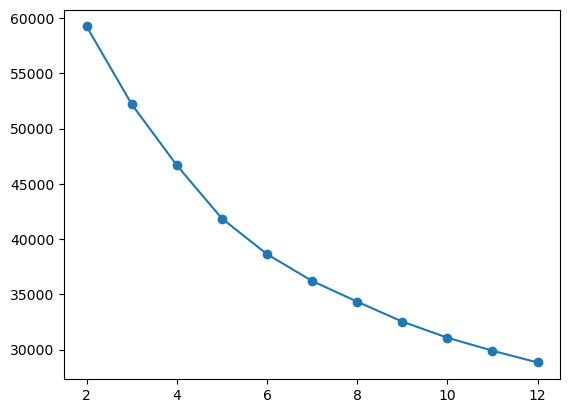

In [132]:
err =[]
for i in range(2,13):
    km1=KMeans(n_clusters=i,random_state=42)
    km1.fit(mypca)
    err.append(km1.inertia_)
plt.plot(range(2,13),err,marker='o')
plt.show()
    

In [135]:
sil_score=[]
for i in range(2,13):
    km2=KMeans(n_clusters=i,random_state=42)
    km2.fit(mypca)

    sil_vals=silhouette_score(pca_df,km2.labels_)
    sil_score.append(sil_vals)
print(sil_score)




[0.27641545454249034, 0.16882872904355722, 0.17261805922804166, 0.18115471245960327, 0.16896005008192927, 0.17207950194055832, 0.17860038732501246, 0.1893373555796127, 0.19280999089388484, 0.1968206287085735, 0.19870552936290375]


In [136]:
pca_df['Labels']=km.labels_
pca_df

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,PCA9,PCA10,PCA11,PCA12,Labels
0,1.510599,-2.201625,0.193569,2.782646,-0.763477,0.017472,0.134126,-0.034417,-0.044742,-0.282031,-0.551585,-0.108579,3
1,2.543507,-2.183862,0.163618,2.628215,-0.776299,-0.003957,0.180032,0.097129,-0.008086,-0.308208,-0.486509,-0.055350,3
2,2.846374,-2.123572,0.236296,2.587986,-0.793286,-0.004337,0.187769,0.133612,0.012039,-0.327139,-0.477769,-0.177241,3
3,1.737718,-2.248041,0.025921,2.714128,-0.768170,-0.009877,0.156249,-0.021374,-0.025362,-0.297026,-0.545305,-0.450889,3
4,2.639729,-2.257757,-0.050886,2.595107,-0.765214,-0.047696,0.283702,0.146858,-0.032745,-0.330672,-0.534689,-0.352163,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4243,0.126293,-1.814802,-0.138468,0.008884,-1.225466,-0.552558,-1.981215,-1.652040,-1.217583,-0.303750,-0.229150,-0.561599,2
4244,-0.864185,-1.754912,0.053469,0.160033,-1.131606,-0.198541,-1.167394,-1.323331,-1.373553,-0.271484,0.063370,-0.202552,2
4245,-0.153128,-1.791917,-0.092203,-0.077285,-1.189869,-0.136484,-1.635142,-1.630140,-1.203876,-0.295710,-0.008135,-0.718835,2
4246,0.332834,-1.393590,0.393395,0.421513,-1.265647,-1.290838,-1.192977,-0.730608,-1.519230,-0.391231,-0.012178,-0.289683,2


In [137]:
pca_df['Labels'].unique()

array([3, 0, 2, 5, 4, 1])

In [138]:
from sklearn.model_selection import train_test_split

In [139]:
X = pca_df.drop(columns='Labels')
Y = pca_df['Labels']
xtrain,xtest,ytrain,ytest = train_test_split(X,Y,test_size = 0.3,random_state=42,stratify=Y)

In [140]:
from sklearn.tree import DecisionTreeClassifier

In [141]:
dt = DecisionTreeClassifier(random_state=42)

In [142]:
dt.fit(xtrain,ytrain)

DecisionTreeClassifier(random_state=42)

In [143]:
np.round(km.cluster_centers_,1)

array([[-3.4, -0.8, -0.8,  0.2,  0.2, -0.4,  0.7,  0.4,  0.1, -0.1,  0.2,
        -0. ],
       [ 6.4, -0.1, -0.6, -0.3, -0.2, -0.2,  0.6,  0.4,  0.1,  0. ,  0.3,
        -0.1],
       [-0.5, -1.5,  0.8, -0.3, -0. ,  0.1, -0.3, -0. ,  0. ,  0.1, -0.1,
         0. ],
       [ 2.2,  0.3, -0.1,  0.4,  0.1,  0. , -0.1, -0.2, -0.1, -0.2, -0.2,
         0. ],
       [-1.1,  1.3, -0.7, -0.1, -0.1,  0.1, -0.3, -0.2,  0. ,  0.1, -0. ,
         0. ],
       [-1.5,  3.1,  5.8,  1.7, -0.3, -0.1,  1. ,  0.2, -0.6,  0.1,  0.1,
        -0.2]])